In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

In [51]:
parts_data = pd.read_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/final_project/data/Project_Data/cleaned_parts_data.csv')
parts_data.head(10)

,Part Number,Category,Description,Supplier Name,Margin %,Margin,Price,Quantity,Sales Last Month,Sales Last 3 Months,...,Gross Profit - Dec,COGS,Starting Inventory,Ending Inventory,Average Inventory,Turnover,Demand,Ordering Cost,Carrying Cost,EOQ
0,0,PM1,return spring,triumph,100.0,7.26,7.26,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0 580 463 999,ACC,euro moto internationalrelectrics bosch,euro moto internationalrelectrics,100.0,629.99,629.99,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,00-0450,ACC,"screw, gearbox,inspec&",moto international,100.0,1.95,1.95,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3,00-548588,ATA,tube 150/90- 15 centre90' stem,butler maps inc,100.0,19.99,19.99,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
4,00-F01740401,ACC,turn signal light control,moto international,100.0,166.99,166.99,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.074362,0.0,0.0
5,00-F02600371,ACC,1399 belt drive,moto international,100.0,51.99,51.99,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0
6,00-G01702301,ACC,1183-rear right indicator assy,moto international,100.0,33.29,33.29,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
7,00-H01701071,ACC,"1182- lens, turn signal (sq",moto international,100.0,13.50,13.50,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
8,00-SC6S,ACC,"usi 6"" steal bar",moto international,100.0,99.99,99.99,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
9,001-027,ACC,xr-15/10 silver mirror,moto international,100.0,39.95,39.95,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [52]:
#how much of the inventory is obsolete and how much is it costing us
obsolete_count = (parts_data['Obsolete'].value_counts() / len(parts_data['Obsolete'])) * 100
print('Obsolete inventory percentage count:')
print(obsolete_count)

obsolete_cost = round(parts_data[parts_data['Obsolete'] == 1]['Total Cost'].sum(), 2)
print(f'Obsolete Total Cost: ${obsolete_cost}')

non_obsolete_cost = round(parts_data[parts_data['Obsolete'] == 0]['Total Cost'].sum(), 2)
print(f'Non-obsolete Cost: ${non_obsolete_cost}')


Obsolete inventory percentage count:
1    50.912351
0    49.087649
Name: Obsolete, dtype: float64
Obsolete Total Cost: $366107.1
Non-obsolete Cost: $1022397.52


In [53]:
#compare the margins
margin_mask = parts_data['Margin %'] < 0 

parts_data[margin_mask][['Part Number', 'Supplier Name', 'Description', 
                         'Quantity','Price', 'Margin %', 'Cost Per Unit', 
                         'Turnover', 'Demand', 'Carrying Cost', 'Ordering Cost', 'EOQ']]

,Part Number,Supplier Name,Description,Quantity,Price,Margin %,Cost Per Unit,Turnover,Demand,Carrying Cost,Ordering Cost,EOQ
1958,04-132,moto international,bulb 12v 45/45w,1,1.99,-16.080402,2.31,0.000000,1.052725e-10,3.93025,0.000000,0.000000e+00
1961,04-136,moto international,"bulb, h4, 60/55w",1,4.99,-26.252505,6.30,0.000000,1.117727e-12,0.00000,NaN,0.000000e+00
1963,04-136A,moto international,60/55w h4 p45t,1,4.99,-44.689379,7.22,0.000000,5.399451e-14,4.86525,9.072000,4.487337e-07
1964,04-136B,moto international,bulb 12v-45/45w h4 p43t clear,1,4.99,-118.637275,10.91,0.000000,1.186742e-14,0.00000,NaN,0.000000e+00
1965,04-137,moto international,"bulb, h4, 35/35w",3,4.99,-37.074148,6.84,0.000000,2.608335e-15,3.36825,0.074362,1.073176e-08
1966,04-139,moto international,"h3 halogen bulb, 55w",2,2.99,-5.016722,3.14,0.000000,5.732846e-16,0.00000,NaN,0.000000e+00
2000,04-1821,moto international,bulb 12v 55w h11 pgj19-2 0609-,3,5.99,-185.642738,17.11,0.645052,7.802113e-01,0.00000,NaN,0.000000e+00
7276,111584,parts canada/power twins,rr sprct 40t 630,1,26.99,-3.556873,27.95,0.000000,9.338480e-07,26.31525,6.840000,6.967507e-04
15482,1990462,royal enfield,silver slip-on silencer-us,1,899.99,-4.222269,937.99,0.000000,9.338429e-07,877.00275,67.200000,3.782998e-04
84738,T2101995-PG,triumph,"cover assembly,radiator,pg",1,89.99,-136.004000,212.38,0.000000,3.121946e-21,1460.08775,0.000000,0.000000e+00


In [54]:
parts_data[parts_data['Sales Last 3 Months'] >= 1][['Part Number', 'Description', 'Price', 'Quantity', 'Margin %', 'Sales Last 3 Months', 'Turnover', 'Demand', 'EOQ']]

,Part Number,Description,Price,Quantity,Margin %,Sales Last 3 Months,Turnover,Demand,EOQ
64,0069925B,"universal cruise control 1""",18.99,1,50.026330,1,0.399831,0.951693,0.0
174,01-05040,lexin smart pump tire pump,85.99,1,22.700314,2,1.220025,3.120842,0.0
177,01-10000,tire iron,14.99,0,100.000000,1,2.000000,0.813346,0.0
226,01-70565,hornet x2 cheek pad set 35mm,92.99,0,100.000000,1,2.031206,0.780211,0.0
479,0140-0073,helmet fx41 range m-bl lg,299.99,0,100.000000,1,2.000000,0.788494,0.0
...,...,...,...,...,...,...,...,...,...
88621,T4007771,"coolant,oat,pre",14.99,15,36.624416,64,1.368495,82.702335,0.0
88765,TFSC01,fork spring compressor race,408.99,0,100.000000,1,2.000000,0.780211,0.0
88777,TIRE,**tire fee (5.00 per tire),5.00,0,100.000000,297,0.000000,348.754105,0.0
88803,TIRE900RALLY,take off tires,319.99,1,6.247070,1,0.638311,0.780211,0.0


In [55]:
# Calculate the total sales for each subset
qtr_sales = parts_data[['Sales - 1st Qtr', 'Sales - 2nd Qtr', 'Sales - 3rd Qtr', 'Sales - 4th Qtr']].sum()
month_sales = parts_data[['Sales - Jan', 'Sales - Feb', 'Sales - Mar', 'Sales - Apr', 
                          'Sales - May', 'Sales - Jun', 'Sales - Jul', 'Sales - Aug',
                          'Sales - Sep', 'Sales - Oct', 'Sales - Nov', 'Sales - Dec']].sum()

# Create separate bar charts for quarters and months
fig_qtr = go.Figure()
fig_qtr.add_trace(go.Bar(x=qtr_sales.index,
                         y=qtr_sales.values,
                         name='Quarterly Sales',
                         marker_color='blue'))

fig_qtr.update_layout(title='Total Sales Comparison by Quarter',
                      xaxis_title='Quarter',
                      yaxis_title='Total Sales',
                      yaxis_tickprefix='$')

fig_month = go.Figure()
fig_month.add_trace(go.Bar(x=month_sales.index,
                           y=month_sales.values,
                           name='Monthly Sales',
                           marker_color='orange'))

fig_month.update_layout(title='Total Sales Comparison by Month',
                        xaxis_title='Month',
                        yaxis_title='Total Sales',
                        yaxis_tickprefix='$')

# Show the interactive charts
fig_qtr.show()
fig_month.show()

Look for parts that have sold in the last 12 months but not in the last 9, 6 or 3

In [56]:
def bad_ordered_parts_data(parts_data, suppliers=[]):
    """
        Gives a list of parts that sold this year but have not sold in more than 9 months
        These parts are most likely going to become obsolete and should not have been ordered again

        Usage:
            Default is all suppliers but can handle a list of 1 or more specific suppliers if desired
    """

    # Create the masks using the corrected comparisons
    sales_mask = (parts_data['Months No Sale'] < 12) & (parts_data['Months No Sale'] >= 9)
    price_mask = parts_data['Price'] > 250.00
    
    # Create a mask to filter the DataFrame for the specified suppliers, if any are provided
    if suppliers:
        suppliers_mask = parts_data['Supplier Name'].isin(suppliers)
    else:
        suppliers_mask = pd.Series(True, index=parts_data.index)  # Select all rows if suppliers list is empty
    
    # Apply all masks to filter the DataFrame
    result_df = parts_data[sales_mask & price_mask & suppliers_mask][['Part Number', 'Description', 'Supplier Name', 'Price', 'Quantity', 'Cost Per Unit', 'Total Cost', 'Months No Sale']]

    return result_df

# Example usage without specifying suppliers (will keep all suppliers):
filtered_parts_data_all = bad_ordered_parts_data(parts_data)
filtered_parts_data_all.to_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/final_project/data/Dealership_Data/bad_orders_parts_all.csv')

In [57]:
# Calculate the 'Supplier Cost' by grouping and summing 'Total Cost' for each supplier
supplier_cost = parts_data.groupby('Supplier Name')['Total Cost'].sum().sort_values(ascending=False)

# Convert the supplier_cost Series back to a DataFrame
supplier_cost_df = supplier_cost.reset_index()

# Filter out the high-cost suppliers
high_cost_suppliers = supplier_cost_df[supplier_cost_df['Total Cost'] > 7000]

# Sum the 'Total Cost' of all other suppliers and create a row for 'Other'
other_suppliers_cost = supplier_cost_df[supplier_cost_df['Total Cost'] <= 7000]['Total Cost'].sum()
other_supplier_row = {'Supplier Name': 'Other', 'Total Cost': other_suppliers_cost}

# Concatenate the high-cost suppliers DataFrame with the 'Other' row DataFrame
supplier_cost_df = pd.concat([high_cost_suppliers, pd.DataFrame([other_supplier_row])]).sort_values(by='Total Cost', ascending=False)
# Create an interactive bar chart
fig = px.bar(supplier_cost_df, x='Supplier Name', y='Total Cost', title='Total Cost per Supplier')
fig.show()

In [58]:
#compare margins for parts where parts are either below or above the 40% threshold
margin_threshold = 40 #desirable margin
dollar_amount = 20 #remove small items that have little affect on bottom line
parts_data_below_margin = parts_data[(parts_data["Margin %"] < margin_threshold) & (parts_data['Price'] > dollar_amount)]
parts_data_above_margin = parts_data[(parts_data["Margin %"] >= margin_threshold) & (parts_data['Price'] > dollar_amount)]

In [59]:
key_cols = ['Part Number', 'Supplier Name', 'Description', 'Quantity', 'Price', 'Total Cost', 'Margin %', 'Months No Sale']
parts_data_below_margin[key_cols]
parts_data_below_margin[key_cols].to_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/final_project/data/Dealership_Data/Parts_Below_Margin_Threshold.csv')

In [60]:
obsolete_below_threshold = parts_data_below_margin[parts_data_below_margin['Months No Sale'] >= 12][key_cols]
obsolete_below_threshold.to_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/final_project/data/Dealership_Data/Parts_Below_Margin_Threshold_Obsolete.csv')

In [61]:

# Calculate the total cost for each subset
total_cost_below_margin = parts_data_below_margin['Total Cost'].sum()
total_cost_above_margin = parts_data_above_margin['Total Cost'].sum()

# Create a grouped bar chart
fig = go.Figure()
fig.add_trace(go.Bar(x=['Below Margin Threshold', 'Above or Equal to Margin Threshold'],
                     y=[total_cost_below_margin, total_cost_above_margin],
                     name='Total Cost',
                     marker_color='blue'))

# Add chart labels and title
fig.update_layout(title='Total Cost of Parts by Margin Group',
                  xaxis_title='Margin Group',
                  yaxis_title='Total Cost',
                  yaxis_tickprefix='$',
                  barmode='group')

# Show the interactive chart
fig.show()

Note: Lots of parts just below the 40% desirable margin

In [62]:
m = parts_data['Margin %'] <= 0
parts_data[m]

,Part Number,Category,Description,Supplier Name,Margin %,Margin,Price,Quantity,Sales Last Month,Sales Last 3 Months,...,Gross Profit - Dec,COGS,Starting Inventory,Ending Inventory,Average Inventory,Turnover,Demand,Ordering Cost,Carrying Cost,EOQ
1958,04-132,ACC,bulb 12v 45/45w,moto international,-16.080402,-0.32,1.990,1,0,0,...,0.0,0.00,1.990,1.990,1.990,0.000000,1.052725e-10,0.000000,3.93025,0.000000e+00
1961,04-136,ACC,"bulb, h4, 60/55w",moto international,-26.252505,-1.31,4.990,1,0,0,...,0.0,0.00,4.990,4.990,4.990,0.000000,1.117727e-12,NaN,0.00000,0.000000e+00
1963,04-136A,ACC,60/55w h4 p45t,moto international,-44.689379,-2.23,4.990,1,0,0,...,0.0,0.00,4.990,4.990,4.990,0.000000,5.399451e-14,9.072000,4.86525,4.487337e-07
1964,04-136B,ACC,bulb 12v-45/45w h4 p43t clear,moto international,-118.637275,-5.92,4.990,1,0,0,...,0.0,0.00,4.990,4.990,4.990,0.000000,1.186742e-14,NaN,0.00000,0.000000e+00
1965,04-137,ACC,"bulb, h4, 35/35w",moto international,-37.074148,-1.85,4.990,3,0,0,...,0.0,0.00,14.970,14.970,14.970,0.000000,2.608335e-15,0.074362,3.36825,1.073176e-08
1966,04-139,ACC,"h3 halogen bulb, 55w",moto international,-5.016722,-0.15,2.990,2,0,0,...,0.0,0.00,5.980,5.980,5.980,0.000000,5.732846e-16,NaN,0.00000,0.000000e+00
2000,04-1821,ACC,bulb 12v 55w h11 pgj19-2 0609-,moto international,-185.642738,-11.12,5.990,3,0,0,...,0.0,17.11,35.080,17.970,26.525,0.645052,7.802113e-01,NaN,0.00000,0.000000e+00
7276,111584,ACC,rr sprct 40t 630,parts canada/power twins,-3.556873,-0.96,26.990,1,0,0,...,0.0,0.00,26.990,26.990,26.990,0.000000,9.338480e-07,6.840000,26.31525,6.967507e-04
15482,1990462,ACC,silver slip-on silencer-us,royal enfield,-4.222269,-38.00,899.990,1,0,0,...,0.0,0.00,898.990,899.990,899.490,0.000000,9.338429e-07,67.200000,877.00275,3.782998e-04
22877,2879768-266-T,P0,"kit-exhaust,stage1,50,csr,blk",polaris,0.000000,0.00,350.990,1,0,0,...,0.0,0.00,350.990,350.990,350.990,0.000000,3.769093e-02,NaN,0.00000,0.000000e+00


In [63]:
supplier_cost = parts_data.groupby('Supplier Name')['Total Cost'].sum().sort_values(ascending=False)

# Convert the supplier_cost Series back to a DataFrame
supplier_cost_df = supplier_cost.reset_index()

# Filter out the high-cost suppliers
high_cost_suppliers = supplier_cost_df[supplier_cost_df['Total Cost'] > 1000]
high_cost_suppliers['Supplier Name'].values

array(['polaris', 'triumph', 'bmw', 'ducati', 'kimpex',
       'parts canada/power twins', 'royal enfield', 'moto international',
       'bell sports inc', 'thibault canada', 'schuberth', 'full bore',
       'klim', 'columbia promotions', 'fundy textile and design ltd',
       'british imports moto internationalrcycles', 'out of the blue',
       'wurth', 'zero moto internationalrcycles', 'island bmw'],
      dtype=object)

In [64]:
main_suppliers = ['bmw', 'polaris', 'triumph', 'ducati', 'parts canada/power twins',
       'kimpex', 'royal enfield', 'motovan', 'bell sports inc',
       'thibault canada', 'schuberth', 'klim', 'full bore',
       'zero motorcycles']

# Assuming you have a parts_data DataFrame

suppliers = parts_data[parts_data['Supplier Name'].isin(main_suppliers)].sort_values(by='Turnover', ascending=False)

# Group by 'Supplier Name' and calculate the mean of 'Turnover'
supplier_turnover = suppliers.groupby('Supplier Name')['Turnover'].mean().reset_index()

# Sort the DataFrame by 'Turnover' in descending order
supplier_turnover = supplier_turnover.sort_values(by='Turnover', ascending=False)

# Create a bar plot
fig = px.bar(supplier_turnover, x='Supplier Name', y='Turnover', title='Average Turnover By High Cost Supplier')
fig.show()

In [65]:
supplier_cost = parts_data.groupby('Supplier Name')['Total Cost'].sum().reset_index()
mask = supplier_cost['Total Cost'] > 1000
supplier_list = supplier_cost[mask]['Supplier Name'].values
supplier_list

# Filter parts_data based on supplier_list
filtered_parts_data = parts_data[parts_data['Supplier Name'].isin(supplier_list)]

# Group by 'Supplier Name' and calculate the mean 'Turnover' values
supplier_turnover = filtered_parts_data.groupby('Supplier Name')['Turnover'].mean().reset_index()

# Sort by 'Turnover' in descending order to get the top suppliers
highest_turn = supplier_turnover.sort_values(by='Turnover', ascending=False)

# Select the top 20 suppliers
top_20_suppliers = highest_turn.head(20)  # Use .head(20) to get the top 20

# Create a bar plot
fig = px.bar(top_20_suppliers, x='Supplier Name', y='Turnover', title='Top 20 Suppliers by Average Turnover')
fig.show()

In [66]:
def categorize_by_value_demand(parts_data, comparison_col, target):
    # Inventory category breakdown in dollars
    total_parts_cost = parts_data[target].sum()

    # These calculations will change once you develop the clustering distance function
    essential_cost = parts_data[parts_data[comparison_col] <= 3][target].sum()
    non_essential_cost = parts_data[(parts_data[comparison_col] > 3) & (parts_data[comparison_col] < 12)][target].sum()
    obsolete_cost = parts_data[parts_data[comparison_col] >= 12][target].sum()

    # Create a DataFrame to store the results
    data = {
        'Category': ['Essential', 'Obsolete', 'Non-Essential'],
        target: [round(essential_cost, 2), round(obsolete_cost, 2), round(non_essential_cost, 2)]
    }
    result_df_cost = pd.DataFrame(data)
    return result_df_cost

# Assuming 'parts_data' is your DataFrame containing the parts information
months_no_sale = categorize_by_value_demand(parts_data, 'Months No Sale', 'Total Cost')
turnover = categorize_by_value_demand(parts_data, 'Months No Sale', 'Margin')

In [67]:
# Creating separate interactive bar plots using plotly
fig1 = px.bar(
    months_no_sale,
    x='Category',
    y='Total Cost',
    color='Category',
    title='Total Cost by Category (Months No Sale)'
)

fig2 = px.bar(
    turnover,
    x='Category',
    y='Margin',
    color='Category',
    title='Margin by Category (Months No Sale)'
)

fig1.show()
fig2.show()

In [68]:
def categorize_by_value_turn(parts_data, comparison_col, target):
    # Inventory category breakdown in dollars
    total_parts_cost = parts_data[target].sum()

    # These calculations will change once you develop the clustering distance function
    essential_cost = parts_data[parts_data[comparison_col] >= 1][target].sum()
    non_essential_cost = parts_data[(parts_data[comparison_col] < 1) & (parts_data[comparison_col] > 0)][target].sum()
    obsolete_cost = parts_data[parts_data[comparison_col] == 0][target].sum()

    # Create a DataFrame to store the results
    data = {
        'Category': ['Essential', 'Obsolete', 'Non-Essential'],
        target: [round(essential_cost, 2), round(obsolete_cost, 2), round(non_essential_cost, 2)]
    }
    result_df_cost = pd.DataFrame(data)
    return result_df_cost

# Assuming 'parts_data' is your DataFrame containing the parts information
months_no_sale = categorize_by_value_turn(parts_data, 'Turnover', 'Total Cost')
turnover = categorize_by_value_turn(parts_data, 'Turnover', 'Margin')

In [69]:
# Creating separate interactive bar plots using plotly
fig1 = px.bar(
    months_no_sale,
    x='Category',
    y='Total Cost',
    color='Category',
    title='Total Cost by Category (Turnover)'
)

fig2 = px.bar(
    turnover,
    x='Category',
    y='Margin',
    color='Category',
    title='Margin by Category (Turnover)'
)

fig1.show()
fig2.show()

In [70]:
def calculate_percentage_categories(parts_data, months_no_sale_column):
    total_parts = parts_data.shape[0]
    
    essential_percent = (parts_data[months_no_sale_column] <= 3).sum() / total_parts * 100
    obsolete_percent = (parts_data[months_no_sale_column] >= 12).sum() / total_parts * 100
    non_essential_percent = ((parts_data[months_no_sale_column] > 3) & (parts_data[months_no_sale_column] < 12)).sum() / total_parts * 100
    
    data = {
        'Category': ['Essential', 'Obsolete', 'Non-Essential'],
        'Percentage': [essential_percent, obsolete_percent, non_essential_percent]
    }
    result_df = pd.DataFrame(data)
    
    return result_df

result_df = calculate_percentage_categories(parts_data, 'Months No Sale')

In [71]:
#interactive pie chart of above:
# Create an interactive pie chart
fig = px.pie(result_df, values='Percentage', names='Category', title='Percentage of Parts in Each Category by Demand')

fig.update_layout(width=800, height=600)

fig.update_layout(legend=dict(font=dict(size=16)))

fig.update_traces(textfont=dict(size=18))

fig.show()

In [72]:
def calculate_turnover_categories(parts_data, turnover_column):
    total_parts = parts_data.shape[0]
    essential_parts = parts_data[parts_data[turnover_column] >= 1]
    obsolete_parts = parts_data[parts_data[turnover_column] == 0]
    non_essential_parts = parts_data[(parts_data[turnover_column] < 1) & (parts_data[turnover_column] > 0)]

    essential_percent = (essential_parts.shape[0] / total_parts) * 100
    obsolete_percent = (obsolete_parts.shape[0] / total_parts) * 100
    non_essential_percent = (non_essential_parts.shape[0] / total_parts) * 100

    data = {
        'Category': ['Essential', 'Obsolete', 'Non-Essential'],
        'Percentage': [essential_percent, obsolete_percent, non_essential_percent]
    }
    result_df = pd.DataFrame(data)
    
    return result_df

parts_category = calculate_turnover_categories(parts_data, 'Turnover')
parts_category

,Category,Percentage
0,Essential,3.363596
1,Obsolete,94.087649
2,Non-Essential,2.531944


In [73]:
#interactive pie chart of above:
# Create an interactive pie chart
fig = px.pie(parts_category, values='Percentage', names='Category', title='Percentage of Parts in Each Category by Turnover')

fig.update_layout(width=800, height=600)

fig.update_layout(legend=dict(font=dict(size=16)))

fig.update_traces(textfont=dict(size=18))

fig.show()

In [74]:
months_no_sale_column = 'Months No Sale'
turnover_column = 'Turnover'
weight_demand = 2/3
weight_turnover = 1/3

percentage_result = calculate_percentage_categories(parts_data, months_no_sale_column)
turnover_result = calculate_turnover_categories(parts_data, turnover_column)

# Merge the two DataFrames based on the 'Category' column
merged_result = pd.merge(percentage_result, turnover_result, on='Category', suffixes=('_percentage', '_turnover'))

# Calculate the weighted average of the percentages
merged_result['Weighted_Percentage'] = (merged_result['Percentage_percentage'] * weight_demand + merged_result['Percentage_turnover'] * weight_turnover) / (weight_demand + weight_turnover)

merged_result


,Category,Percentage_percentage,Percentage_turnover,Weighted_Percentage
0,Essential,38.622506,3.363596,26.869536
1,Obsolete,50.912351,94.087649,65.304117
2,Non-Essential,10.465142,2.531944,7.820743


In [75]:
weighted_percentage = merged_result[['Category','Weighted_Percentage']]

#interactive pie chart of above:
# Create an interactive pie chart
fig = px.pie(weighted_percentage, values='Weighted_Percentage', names='Category', title='Percentage of Parts in Each Category - Weighted Average')

fig.update_layout(width=800, height=600)

fig.update_layout(legend=dict(font=dict(size=16)))

fig.update_traces(textfont=dict(size=18))

fig.show()

In [76]:
#dig deeper into why turnovr is so bad
turnover_mask = parts_data['Turnover'] < 1

low_turnover = parts_data[turnover_mask]

In [77]:
parts_data.columns

Index(['Part Number', 'Category', 'Description', 'Supplier Name', 'Margin %',
       'Margin', 'Price', 'Quantity', 'Sales Last Month',
       'Sales Last 3 Months', 'Sales Last 6 Months', 'Sales Last 9 Months',
       'Sales Last 12 Months', 'Sales Last 2 Years', 'Sales Last 3 Years',
       'Sales Last 4 Years', 'Sales Last 5 Years', 'Sales Last 10 Years',
       'Months No Sale', 'Reorder Point', 'Sales - Jan', 'Sales - Feb',
       'Sales - Mar', 'Sales - Apr', 'Sales - May', 'Sales - Jun',
       'Sales - Jul', 'Sales - Aug', 'Sales - Sep', 'Sales - Oct',
       'Sales - Nov', 'Sales - Dec', 'Sales - 1st Qtr', 'Sales - 2nd Qtr',
       'Sales - 3rd Qtr', 'Sales - 4th Qtr', 'Sales - This Year',
       'Sales - Last Year', 'Quantity Ordered YTD', 'Quantity Received YTD',
       'Cost Per Unit', 'Total Cost', 'Obsolete', 'Gross Profit -  Last Month',
       'Gross Profit -  Last 3 Months', 'Gross Profit -  Last 6 Months',
       'Gross Profit -  Last 9 Months', 'Gross Profit -  Last 

In [78]:
supplier_cost = parts_data.groupby('Supplier Name')['Total Cost'].sum().reset_index()
mask = supplier_cost['Total Cost'] > 1000
supplier_list = supplier_cost[mask]['Supplier Name'].values
supplier_list

# Filter parts_data based on supplier_list
time_in_inventory_mask = parts_data['Months No Sale'] <= 24
filtered_parts_data = parts_data[parts_data['Supplier Name'].isin(supplier_list)][time_in_inventory_mask]

point_size = 70  # Adjust the size as needed
point_opacity = 0.7  # Adjust the opacity as needed

# Create the scatter plot
fig = px.scatter(
    filtered_parts_data,
    x='Total Gross Profit',
    y='Turnover',
    color='Supplier Name',  # Use the new column for color
    hover_name='Part Number',
    hover_data=['Description', 'EOQ'],
    size='Demand',
    size_max=point_size,  # Set maximum marker size
    opacity=point_opacity,  # Set opacity
    title='Interactive Scatterplot of Turnover Relative To Gross Profit',
    labels={'Turnover': 'Turnover'},
    template='plotly'  # Use the 'plotly' template for better interactivity
)



fig.show()

/var/folders/59/vc05kjdn7s14r9w654dq4xlh0000gn/T/ipykernel_58576/1879486740.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [79]:
gross_profit_mask = parts_data['Total Gross Profit'] < 0

cols_to_use = ['Part Number', 'Description', 'Supplier Name','Price', 'Quantity',
               'Quantity Ordered YTD', 'Cost Per Unit', 'Total Cost', 'Sales Last 6 Months', 
               'Sales - This Year', 'Gross Profit -  Last 6 Months', 'Total Gross Profit',
               'Turnover', 'Demand', 'EOQ']

parts_data[gross_profit_mask][cols_to_use]

,Part Number,Description,Supplier Name,Price,Quantity,Quantity Ordered YTD,Cost Per Unit,Total Cost,Sales Last 6 Months,Sales - This Year,Gross Profit - Last 6 Months,Total Gross Profit,Turnover,Demand,EOQ
2706,0603-0070,renthal cl003 clamp kit,parts canada/power twins,150.99,1,0,85.61,85.610,0,1,0.00,-150.990,0.441755,0.780298,0.000000
7259,11151335756,breather,bmw,103.49,0,0,70.20,0.000,0,1,0.00,-103.490,2.000000,0.780211,0.000000
9242,12110311A,piston pin circlip,ducati,9.99,12,0,4.56,54.720,12,12,-119.88,-119.880,0.371638,9.362526,0.000000
19944,26111230414,screw,bmw,6.99,21,0,4.53,95.130,4,4,-27.96,-27.960,0.116266,3.120842,0.000000
21499,286095009,ww navy ls performance tee,polaris,84.99,1,0,21.25,21.250,0,1,0.00,-84.990,0.222245,0.780211,0.000000
21538,286135203,"imc textile belt bk, m",polaris,44.99,0,0,29.24,0.000,1,1,44.99,-44.990,2.000000,0.843260,0.000000
22855,2879577-01,"kit-bag,windshield,blk",polaris,259.99,1,0,181.99,181.990,0,1,0.00,-259.990,0.518512,1.294668,0.000000
25234,31427660426,"pan-head machine screw, rear",bmw,6.99,1,0,3.82,3.820,1,1,-6.99,-6.990,0.429213,0.821542,0.000000
25447,31428520150,"spacer, silver",bmw,37.49,0,0,23.84,0.000,0,1,0.00,-37.490,2.000000,0.780211,0.000000
30789,3601-0605-L,"moto internationalrex,4t,15w50",parts canada/power twins,17.99,212,0,9.25,1963.775,233,233,4191.67,-3193.225,0.440125,182.734898,0.000000


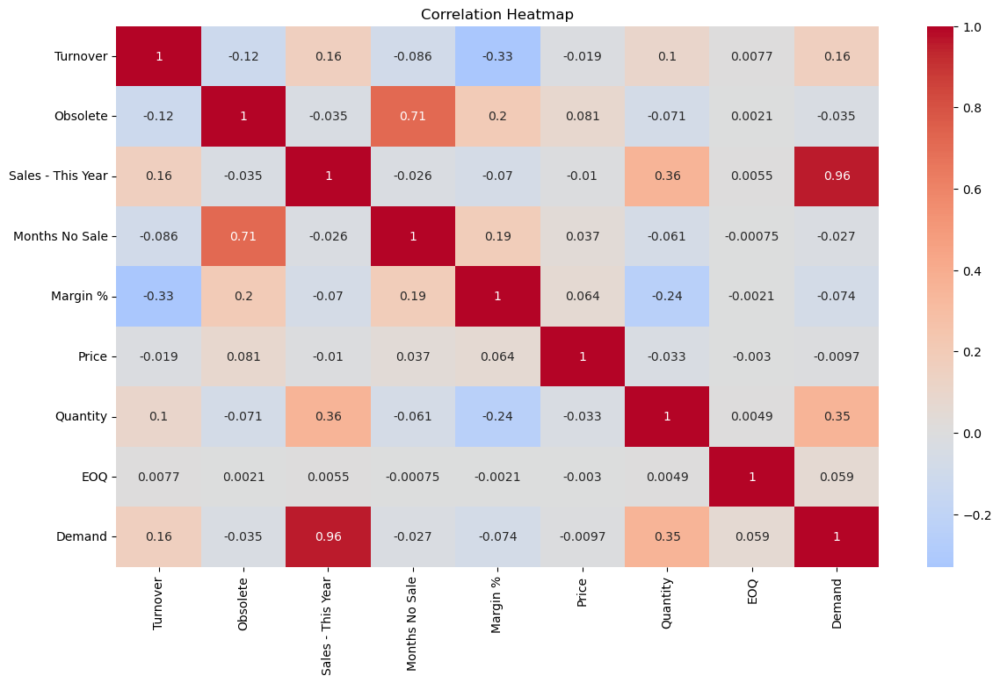

In [80]:
key_columns = ['Turnover', 'Obsolete', 'Sales - This Year',
       'Months No Sale','Margin %', 'Price', 'Quantity', 'EOQ', 'Demand']

correlation_matrix = low_turnover[key_columns].corr()

plt.figure(figsize=(14, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

In [81]:
def correlation_calculator(dataframe, target_feature, mask_value=None):
    numerical_cols = dataframe.select_dtypes(include='number').columns
    correlation_results = {}
    if mask_value is not None:
        mask = dataframe[target_feature] < mask_value
        correlation = dataframe[numerical_cols][mask].corr()[target_feature]
    else:
        correlation = dataframe[numerical_cols].corr()[target_feature]

    for feature, corr in correlation.items():
        if np.isnan(corr):
            corr = 0.0
        correlation_results[feature] = corr

    return correlation_results



In [82]:
def create_correlation_bar_plot(features, correlations, title, x_label='Variable', y_label='Correlation', height=800):
    # Create a bar plot using Plotly
    fig = px.bar(
        x=features,
        y=correlations,
        title=title,
        labels={'x': x_label, 'y': y_label},
        template='plotly',  # You can choose a different template if you prefer
    )

    # Customize layout and appearance
    fig.update_layout(
        xaxis_tickangle=-90,
        xaxis_title=None,
        yaxis_title=y_label,
        height=height,
    )

    # Show the interactive plot
    fig.show()

In [83]:
results = correlation_calculator(parts_data, 'Turnover', 0.000000000000000000000000000001)
results.pop('Turnover')  # Remove 'Turnover' feature from the results

features = list(results.keys())
correlations = list(results.values())

create_correlation_bar_plot(features, correlations, 'Correlation with Turnover')

Turnover has a strong negative correlation with Gross profit in March. That means that when Gross Profit goes up in March turnover goes down

In [84]:
results = correlation_calculator(parts_data, 'EOQ')
results.pop('EOQ')  # Remove 'EOQ' feature from the results

features = list(results.keys())
correlations = list(results.values())

create_correlation_bar_plot(features, correlations, 'Correlation with EOQ')

In [85]:
results = correlation_calculator(parts_data, 'Obsolete')
results.pop('Obsolete')  # Remove 'EOQ' feature from the results

features = list(results.keys())
correlations = list(results.values())

create_correlation_bar_plot(features, correlations, 'Correlation with Obsolete')

In [86]:
results = correlation_calculator(parts_data, 'Demand')
results.pop('Demand')  # Remove 'EOQ' feature from the results

features = list(results.keys())
correlations = list(results.values())

create_correlation_bar_plot(features, correlations, 'Correlation with Demand')

In [87]:
import plotly.express as px

sorted_turnover = parts_data.sort_values(by='Turnover', ascending=False)

cumulative_contribution = sorted_turnover['Turnover'].cumsum()

normalized_contribution = cumulative_contribution / cumulative_contribution.max()

fig = px.line(
    x=range(1, len(sorted_turnover) + 1),
    y=normalized_contribution,
    markers=True,
    title='Cumulative Contribution of Parts to Turnover',
    labels={'x': 'Number of Features', 'y': 'Cumulative Contribution'}
)

fig.update_layout(
    xaxis_title='Number of Parts',
    yaxis_title='Cumulative Contribution',
    xaxis=dict(showline=True, showgrid=True),
    yaxis=dict(showline=True, showgrid=True),
    template='plotly_white'  # Use a different template if you prefer
)

fig.show()


The graph above describes how many parts are contributing strongly to turnover and how many are not

In [88]:
brand_mask = (parts_data['Supplier Name'] == 'bmw') & (parts_data['Quantity'] > 0)
analysis_columns = ['Part Number', 'Description', 'Price', 'Total Cost', 'Margin %', 'Quantity', 'Quantity Ordered YTD', 
                    'Sales Last 3 Months', 'Sales - This Year', 'Months No Sale','COGS', 'Turnover', 'Demand', 'Ordering Cost', 'Carrying Cost', 'EOQ']

bmw_data = parts_data[brand_mask][analysis_columns]

bmw_data.to_csv('/Users/skylerwilson/Desktop/Lighthouse_Labs/Projects/final_project/data/Dealership_Data/bmw_parts_data.csv')